mapping keys to connect datasets:
|type|CBS|Call|Geodata|
|---|---|---|---|
|neighbourhood code|gwb_code_10|NA|buurtcode|
|neighbourhood|regio|**wplNam**, pmeRegionName|buurtnaam|
|postcode|NA|pme_wplId|meest_voorkomende_postcode|
|municipality|gm_naam|gemName|gemeentenaam|
|municipality code|gwb_code_10|pme_gemId|gemeentecode|


Steps to clean data:

**Neighbourhood dataset**
1. Create neighbourhood-level dataframe: df_neighbourhood

**Municipality dataset**
1. Create neighbourhood-level dataframe: df_municipality
2. Aggregate Neighbourhood geometry dataset at municipality level
    3. Add aggregated columns to df_municipality

**CBS dataset**
1. Filter data at buurt level
2. Filter columns to be used: ["ste_mvs", "ste_oad", "bev_dich", "a_lan_ha", "a_inw", "a_hh_z_k", "a_hh_m_k", "g_hhgro", "a_00_14", "a_15_24", "a_25_44", "a_45_64", "a_65_oo", "g_ink_po", "g_ink_pi", "p_ink_li", "p_ink_hi", "p_n_act", "p_hh_li", "p_hh_hi", "p_hh_lkk", "p_hh_osm"]
    3. add these data to df_neighbourhood
    4. add these data to df_municipality
4. Change type of selected columns to number
5. Fill missing data:
    5. Inspect % of missing data
    6. Use Moran's I to validate using neighbourhood mean
    7. Fill value with missing data
  
**Neighbourhood geometry dataset**
1. Columns to keep: ["buurtcode", "buurtnaam", "gemeentecode", "gemeentenaam", "meest_voorkomende_postcode", "geometry", "omgevingsadressendichtheid", "stedelijkheid_adressen_per_km2", "bevolkingsdichtheid_inwoners_per_km2", "aantal_inwoners", "percentage_personen_0_tot_15_jaar", "percentage_personen_15_tot_25_jaar", "percentage_personen_25_tot_45_jaar", "percentage_personen_45_tot_65_jaar", "percentage_personen_65_jaar_en_ouder", "geboorte_totaal", "geboortes_per_1000_inwoners", "sterfte_totaal", "sterfte_relatief", "aantal_huishoudens", "percentage_huishoudens_zonder_kinderen", "percentage_huishoudens_met_kinderen", "percentage_westerse_migratieachtergrond", "percentage_niet_westerse_migratieachtergrond", "percentage_uit_marokko", "percentage_uit_nederlandse_antillen_en_aruba", "percentage_uit_suriname", "percentage_uit_turkije", "woningvoorraad", "gemiddelde_woningwaarde", "percentage_eengezinswoning", "percentage_meergezinswoning", "aantal_inkomensontvangers", "gemiddeld_inkomen_per_inkomensontvanger", "gemiddeld_inkomen_per_inwoner", "percentage_personen_met_laag_inkomen", "percentage_personen_met_hoog_inkomen", "percentage_huishoudens_met_laag_inkomen", "percentage_huishoudens_met_hoog_inkomen", "percentage_huishoudens_onder_of_rond_sociaal_minimum", "percentage_niet_actieven_2", "personenautos_totaal", "personenautos_per_huishouden", "personenautos_per_km2", "motortweewielers_totaal", "oppervlakte_land_in_ha"]
4. Change type of selected columns to number
5. Fill missing data:
    5. Inspect % of missing data
    6. Use Moran's I to validate using neighbourhood mean
    7. Fill value with missing data

**Call dataset**
1. Filter by year: 2017
2. Select relevant columns: ["pmeTimeStamp", "pme_wplId", "wplNam", "gemName", "pmeDienst", ]
3. Inspect missing data for: 
4. Create starts for "pmeDienst" per month:
    4. get_dummies for "pmeDienst"
    5. groupby neighbourhood > filter by month > sum > add column to df_neighbourhood
    6. groupby municipality > filter by month > sum > add column to df_municipality

**Add geometry shape to final dataset**
1. add geometry column to df_neighbourhood
2. add geometry column to df_municipality

In [93]:
import os
from IPython.display import display

import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt

import contextily as cx
from pysal.lib import weights
from pysal.explore import esda
from splot.esda import moran_scatterplot, lisa_cluster, plot_local_autocorrelation

%matplotlib inline

In [2]:
df_cbs_raw = pd.read_excel(os.path.join("data", "kwb-2017.xls"))
df_call_raw = pd.read_csv(os.path.join("data", "112_calls_data.csv"))

geodata_url_municipality = "https://service.pdok.nl/cbs/gebiedsindelingen/atom/v1_0/downloads/cbsgebiedsindelingen2017.gpkg"
df_gd_municipality = gpd.read_file(geodata_url_municipality)

geodata_url_neighbourhood = "https://service.pdok.nl/cbs/wijkenbuurten/2017/atom/downloads/WijkBuurtkaart_2017_v3.gpkg"
df_gd_neighbourhood = gpd.read_file(geodata_url_neighbourhood)

# Neighbourhood geometry dataset

In [3]:
df_gd_neighbourhood.head()

,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijziging_wijken_en_buurten,water,meest_voorkomende_postcode,dekkingspercentage,omgevingsadressendichtheid,...,attractiepark_gemiddeld_aantal_binnen_50_km,theater_gemiddelde_afstand_in_km,theater_gemiddeld_aantal_binnen_5_km,theater_gemiddeld_aantal_binnen_10_km,theater_gemiddeld_aantal_binnen_20_km,gemiddelde_afstand_tot_museum,gemiddeld_aantal_musea_binnen_5_km,gemiddeld_aantal_musea_binnen_10_km,gemiddeld_aantal_musea_binnen_20_km,geometry
0,BU00030000,Appingedam-Centrum,WK000300,GM0003,Appingedam,1,NEE,9901,1,1190,...,11.0,5.3,0.2,1.0,1.0,0.5,1.0,2.0,6.0,"MULTIPOLYGON (((253641.500 594417.813, 253607...."
1,BU00030001,Appingedam-West,WK000300,GM0003,Appingedam,1,NEE,9903,5,894,...,11.7,6.3,0.0,1.0,1.0,1.0,1.0,2.0,6.0,"MULTIPOLYGON (((251260.528 594393.827, 251260...."
2,BU00030002,Appingedam-Oost,WK000300,GM0003,Appingedam,1,NEE,9902,1,1112,...,11.0,5.1,0.4,1.0,1.0,1.3,1.1,2.0,5.2,"MULTIPOLYGON (((254580.674 594573.506, 254580...."
3,BU00030007,Verspreide huizen Damsterdiep en Eemskanaal,WK000300,GM0003,Appingedam,1,NEE,9903,4,351,...,11.7,7.0,0.0,1.0,1.0,1.8,1.0,2.0,5.8,"MULTIPOLYGON (((251377.797 593488.313, 251331...."
4,BU00030008,Verspreide huizen ten zuiden van Eemskanaal,WK000300,GM0003,Appingedam,1,NEE,9902,1,74,...,14.4,7.6,0.0,1.0,1.1,3.2,1.0,2.0,4.7,"MULTIPOLYGON (((254983.248 592485.983, 254956...."


<Axes: >

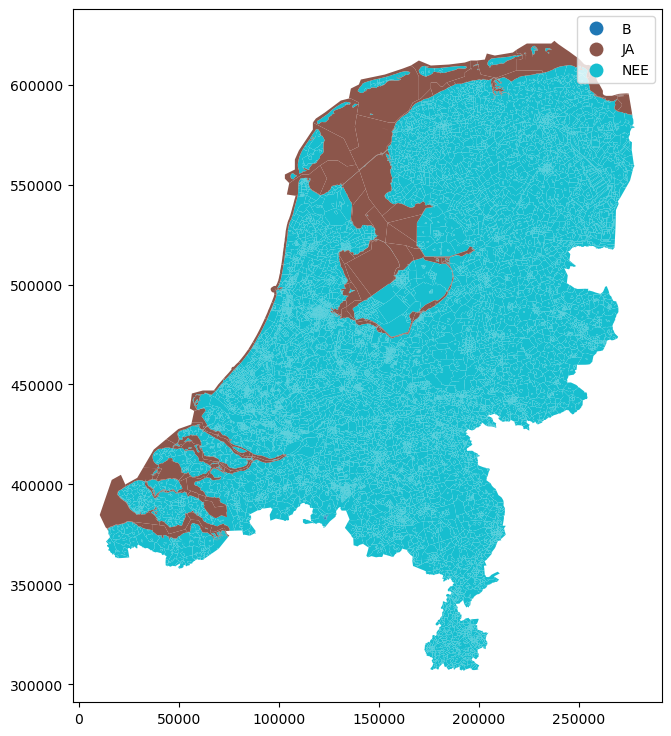

In [4]:
df_gd_neighbourhood.plot(column="water", legend=True, figsize=(9, 9), aspect="equal")

In [5]:
df_gd_neighbourhood.water.value_counts()

water
NEE    13208
JA        99
B          1
Name: count, dtype: int64

In [6]:
df_gd_neighbourhood[df_gd_neighbourhood.water == "B"]

,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijziging_wijken_en_buurten,water,meest_voorkomende_postcode,dekkingspercentage,omgevingsadressendichtheid,...,attractiepark_gemiddeld_aantal_binnen_50_km,theater_gemiddelde_afstand_in_km,theater_gemiddeld_aantal_binnen_5_km,theater_gemiddeld_aantal_binnen_10_km,theater_gemiddeld_aantal_binnen_20_km,gemiddelde_afstand_tot_museum,gemiddeld_aantal_musea_binnen_5_km,gemiddeld_aantal_musea_binnen_10_km,gemiddeld_aantal_musea_binnen_20_km,geometry
13307,BU09989999,Buitenland,WK099899,GM0998,,-99999999,B,,-99999999,-99999999,...,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,"MULTIPOLYGON (((124743.040 384891.210, 124731...."


In [7]:
df_gd_neighbourhood[df_gd_neighbourhood.water == "JA"].head()

,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijziging_wijken_en_buurten,water,meest_voorkomende_postcode,dekkingspercentage,omgevingsadressendichtheid,...,attractiepark_gemiddeld_aantal_binnen_50_km,theater_gemiddelde_afstand_in_km,theater_gemiddeld_aantal_binnen_5_km,theater_gemiddeld_aantal_binnen_10_km,theater_gemiddeld_aantal_binnen_20_km,gemiddelde_afstand_tot_museum,gemiddeld_aantal_musea_binnen_5_km,gemiddeld_aantal_musea_binnen_10_km,gemiddeld_aantal_musea_binnen_20_km,geometry
13208,BU00109998,,WK001099,GM0010,Delfzijl,-99999999,JA,,-99999999,-99999999,...,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,"MULTIPOLYGON (((258435.430 604323.850, 257659...."
13209,BU00349997,,WK003499,GM0034,Almere,-99999999,JA,,-99999999,-99999999,...,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,"MULTIPOLYGON (((150213.998 479503.726, 150223...."
13210,BU00509997,,WK005099,GM0050,Zeewolde,-99999999,JA,,-99999999,-99999999,...,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,"MULTIPOLYGON (((170588.413 486792.192, 170595...."
13211,BU00569997,,WK005699,GM0056,Zuidhorn,-99999999,JA,,-99999999,-99999999,...,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,"MULTIPOLYGON (((215284.173 595049.928, 215284...."
13212,BU00589997,,WK005899,GM0058,Dongeradeel,-99999999,JA,,-99999999,-99999999,...,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,-99999999.0,"MULTIPOLYGON (((207944.730 603291.209, 207932...."


"Buitenland" means foreign land.

The neighbourhood that has value "water == JE" is the water, so data is missed from these neighbourhood.

So, only retain data from the neighbourhood where "water == NEE"

In [94]:
selected_columns = ["buurtcode", 
                    "buurtnaam", 
                    "gemeentecode", 
                    "gemeentenaam", 
                    "meest_voorkomende_postcode", 
                    "geometry", 
                    "omgevingsadressendichtheid", 
                    "stedelijkheid_adressen_per_km2", 
                    "bevolkingsdichtheid_inwoners_per_km2", 
                    "aantal_inwoners", 
                    "percentage_personen_0_tot_15_jaar", 
                    "percentage_personen_15_tot_25_jaar", 
                    "percentage_personen_25_tot_45_jaar", 
                    "percentage_personen_45_tot_65_jaar", 
                    "percentage_personen_65_jaar_en_ouder", 
                    "geboorte_totaal", 
                    "geboortes_per_1000_inwoners", 
                    "sterfte_totaal", 
                    "sterfte_relatief", 
                    "aantal_huishoudens", 
                    "percentage_huishoudens_zonder_kinderen", 
                    "percentage_huishoudens_met_kinderen", 
                    "percentage_westerse_migratieachtergrond", 
                    "percentage_niet_westerse_migratieachtergrond", 
                    "percentage_uit_marokko", 
                    "percentage_uit_nederlandse_antillen_en_aruba", 
                    "percentage_uit_suriname", "percentage_uit_turkije", 
                    "woningvoorraad", 
                    "gemiddelde_woningwaarde", 
                    "percentage_eengezinswoning", 
                    "percentage_meergezinswoning", 
                    "aantal_inkomensontvangers", 
                    "gemiddeld_inkomen_per_inkomensontvanger", 
                    "gemiddeld_inkomen_per_inwoner", 
                    "percentage_personen_met_laag_inkomen", 
                    "percentage_personen_met_hoog_inkomen", 
                    "percentage_huishoudens_met_laag_inkomen", 
                    "percentage_huishoudens_met_hoog_inkomen", 
                    "percentage_huishoudens_onder_of_rond_sociaal_minimum", 
                    "percentage_niet_actieven_2", 
                    "personenautos_totaal", 
                    "personenautos_per_huishouden", 
                    "personenautos_per_km2", 
                    "motortweewielers_totaal", 
                    "oppervlakte_land_in_ha"]
df_neighbourhood = df_gd_neighbourhood.loc[df_gd_neighbourhood.water=="NEE", selected_columns].copy()
obt_columns = df_neighbourhood.select_dtypes(include=["object"]).columns
num_columns = df_neighbourhood.select_dtypes(include=["int64", "float64"]).columns
geo_columns = ["geometry"]

In [9]:
df_neighbourhood.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 13208 entries, 0 to 13207
Data columns (total 46 columns):
 #   Column                                                Non-Null Count  Dtype   
---  ------                                                --------------  -----   
 0   buurtcode                                             13208 non-null  object  
 1   buurtnaam                                             13208 non-null  object  
 2   gemeentecode                                          13208 non-null  object  
 3   gemeentenaam                                          13208 non-null  object  
 4   meest_voorkomende_postcode                            13208 non-null  object  
 5   geometry                                              13208 non-null  geometry
 6   omgevingsadressendichtheid                            13208 non-null  int64   
 7   stedelijkheid_adressen_per_km2                        13208 non-null  int64   
 8   bevolkingsdichtheid_inwoners_per_km2       

In [10]:
df_neighbourhood.bevolkingsdichtheid_inwoners_per_km2.value_counts()

bevolkingsdichtheid_inwoners_per_km2
-99999999    598
 15           77
 12           67
 11           66
 32           66
            ... 
 10576         1
 16931         1
 11995         1
 11837         1
 2870          1
Name: count, Length: 5810, dtype: int64

The info shows that the selected socio-economic factors don't have missing values.
Looking at the value_counts() of some factors, the missing valuues are filled with -99999999

This data, therefore, needs further cleaning to remove the missing values.

The first step is to change -99999999 to np.nan

In [95]:
for col in num_columns:
    index = df_neighbourhood[col][df_neighbourhood[col]<0].index
    df_neighbourhood.loc[index, col] = -1

After changing -9999999 to -1, the count of missing values for the different variables are as follows

In [12]:
(df_neighbourhood[num_columns]<0).sum(axis=0)

omgevingsadressendichtheid                                 58
stedelijkheid_adressen_per_km2                             58
bevolkingsdichtheid_inwoners_per_km2                      598
aantal_inwoners                                             0
percentage_personen_0_tot_15_jaar                        1363
percentage_personen_15_tot_25_jaar                       1363
percentage_personen_25_tot_45_jaar                       1363
percentage_personen_45_tot_65_jaar                       1363
percentage_personen_65_jaar_en_ouder                     1363
geboorte_totaal                                             0
geboortes_per_1000_inwoners                                 0
sterfte_totaal                                              0
sterfte_relatief                                            0
aantal_huishoudens                                          0
percentage_huishoudens_zonder_kinderen                    903
percentage_huishoudens_met_kinderen                       903
percenta

# aantal_inwoners

In [13]:
df_neighbourhood.aantal_inwoners.value_counts()

aantal_inwoners
0        423
5        152
50       125
10       122
15       103
        ... 
9030       1
5550       1
6290       1
11655      1
7050       1
Name: count, Length: 1355, dtype: int64

<Axes: >

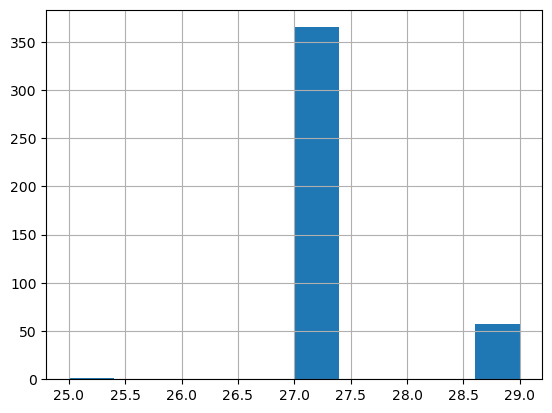

In [96]:
index = df_neighbourhood[df_neighbourhood["aantal_inwoners"]==0].index
(df_neighbourhood.loc[index, num_columns]<0).sum(axis=1).hist()

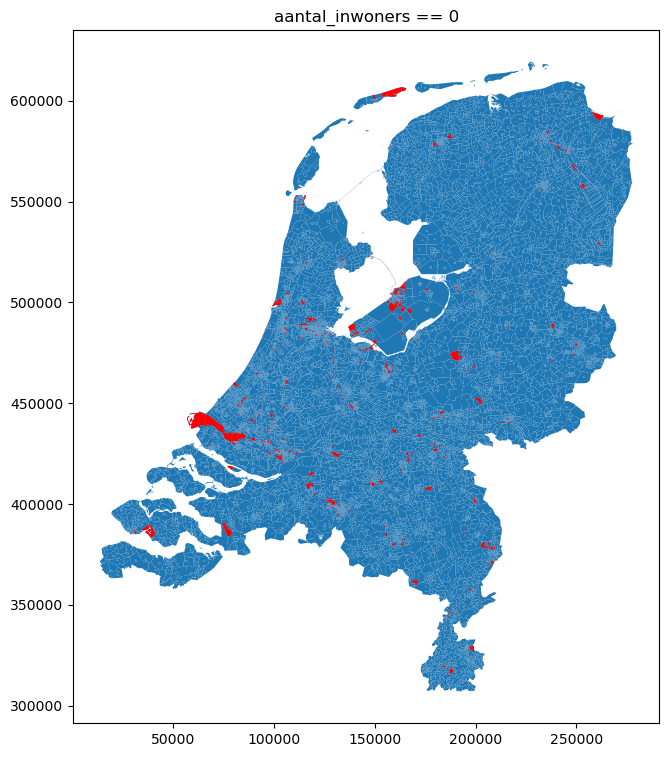

In [15]:
# plot the zero population
f, ax = plt.subplots(1, figsize=(9, 9))
df_neighbourhood.plot(ax=ax, linewidth=0.1, aspect="equal")
zero_population = df_neighbourhood.loc[index, ['geometry']]
# Plot zero population polygons
zero_population.plot(ax=ax, linewidth=0.1, facecolor='red', alpha=1, aspect="equal")
_ = ax.set_title("aantal_inwoners == 0")

Looking at the "aantal_inwoners" (total number of inhabitants),
1. there are some neighbourhood with 0 inhabitants
2. these areas with 0 inhabitants also have missing values for almost all other variables
3. from the maps where there are 0 inhabitants, one explanation could be that these areas are national parks, forests, etc.

So, the missing values from the variables for the neighbourhoods with 0 inhabitants will be replaced with 0.

In [97]:
for col in num_columns:
    ind = (df_neighbourhood.loc[index, col] < 0).index
    df_neighbourhood.loc[ind, col] = 0

# aantal_huishoudens

In [17]:
df_neighbourhood.aantal_huishoudens.value_counts()

aantal_huishoudens
0       600
5       288
25      253
30      239
15      235
       ... 
5520      1
3695      1
6160      1
7135      1
1895      1
Name: count, Length: 786, dtype: int64

<Axes: >

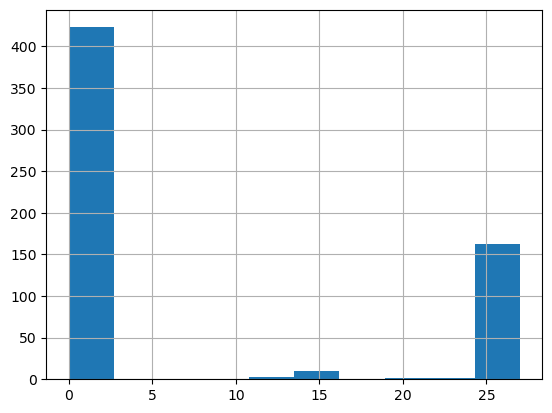

In [98]:
index = df_neighbourhood[df_neighbourhood["aantal_huishoudens"]==0].index
(df_neighbourhood.loc[index, num_columns]<0).sum(axis=1).hist()

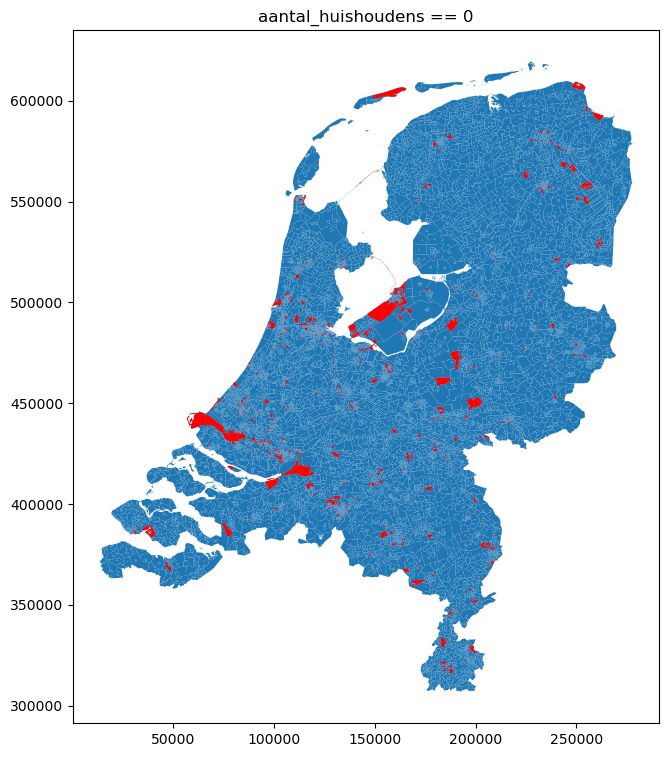

In [19]:
# plot the zero households
f, ax = plt.subplots(1, figsize=(9, 9))
df_neighbourhood.plot(ax=ax, linewidth=0.1, aspect="equal")
zero_population = df_neighbourhood.loc[index, ['geometry']]
# Plot zero population polygons
zero_population.plot(ax=ax, linewidth=0.1, facecolor='red', alpha=1, aspect="equal")
_ = ax.set_title("aantal_huishoudens == 0")

Looking at the "aantal_huishoudens" (total number of households),

1. there are some neighbourhood with 0 households
2. these areas with 0 inhabitants also have missing values for some other variables
3. from the maps where there are 0 inhabitants, one explanation could be that these areas are national parks, forests, etc.
So, the missing values from the variables for the neighbourhoods with 0 inhabitants will be replaced with 0.

In [99]:
for col in num_columns:
    ind = (df_neighbourhood.loc[index, col] < 0).index
    df_neighbourhood.loc[ind, col] = 0

# stedelijkheid_adressen_per_km2

**stedelijkheid_adressen_per_km2** is number of addresses per km2. For missing values, given that **oppervlakte_land_in_ha** total land area in ha) and **woningvoorraad** (total houses) do not have missing values, the following formula can be applied:

**stedelijkheid_adressen_per_km2 = round(woningvoorraad / (oppervlakte_land_in_ha * 100))**

In [100]:
index = df_neighbourhood[df_neighbourhood["stedelijkheid_adressen_per_km2"]<0].index
df_neighbourhood.loc[index, "stedelijkheid_adressen_per_km2"] = round(df_neighbourhood.loc[index, "woningvoorraad"] \
                                                                      / (df_neighbourhood.loc[index, "oppervlakte_land_in_ha"] * 100))

# bevolkingsdichtheid_inwoners_per_km2

**bevolkingsdichtheid_inwoners_per_km2** is population density per km2. For missing values, given that **oppervlakte_land_in_ha** (total land area in ha) and **aantal_inwoners** (total inhabitants) do not have missing values, the following formula can be applied:

**bevolkingsdichtheid_inwoners_per_km2 = round(aantal_inwoners / (oppervlakte_land_in_ha * 100))**



In [101]:
index = df_neighbourhood[df_neighbourhood["bevolkingsdichtheid_inwoners_per_km2"]<0].index
df_neighbourhood.loc[index, "bevolkingsdichtheid_inwoners_per_km2"] = round(df_neighbourhood.loc[index, "aantal_inwoners"] \
                                                                            / (df_neighbourhood.loc[index, "oppervlakte_land_in_ha"] * 100))

# personenautos_per_huishouden

**personenautos_per_huishouden** is personal autos per household. For missing values, given that **personenautos_totaal** (total personal autos) and **aantal_huishoudens** (total households) do not have missing values, the following formula can be applied:

**personenautos_per_huishouden = round(personenautos_totaal/ aantal_huishoudens)**

In [102]:
index = df_neighbourhood[df_neighbourhood["personenautos_per_huishouden"]<0].index
df_neighbourhood.loc[index, "personenautos_per_huishouden"] = round(df_neighbourhood.loc[index, "personenautos_totaal"] \
                                                                    / df_neighbourhood.loc[index, "aantal_huishoudens"])

# personenautos_per_km2

**personenautos_per_km2** is personal autos per km2. For missing values, given that **personenautos_totaal** (total personal autos) and **oppervlakte_land_in_ha** (total land area in ha) do not have missing values, the following formula can be applied:

**personenautos_per_km2 = round(personenautos_totaal / (oppervlakte_land_in_ha * 100))**

In [103]:
index = df_neighbourhood[df_neighbourhood["personenautos_per_km2"]<0].index
df_neighbourhood.loc[index, "personenautos_per_km2"] = round(df_neighbourhood.loc[index, "personenautos_totaal"] \
                                                             / (df_neighbourhood.loc[index, "oppervlakte_land_in_ha"] * 100))

After filling these values, the count of missing values for different variables are as follows:

In [104]:
(df_neighbourhood[num_columns]<0).sum(axis=0)

omgevingsadressendichtheid                                  1
stedelijkheid_adressen_per_km2                              0
bevolkingsdichtheid_inwoners_per_km2                        0
aantal_inwoners                                             0
percentage_personen_0_tot_15_jaar                         777
percentage_personen_15_tot_25_jaar                        777
percentage_personen_25_tot_45_jaar                        777
percentage_personen_45_tot_65_jaar                        777
percentage_personen_65_jaar_en_ouder                      777
geboorte_totaal                                             0
geboortes_per_1000_inwoners                                 0
sterfte_totaal                                              0
sterfte_relatief                                            0
aantal_huishoudens                                          0
percentage_huishoudens_zonder_kinderen                    303
percentage_huishoudens_met_kinderen                       303
percenta

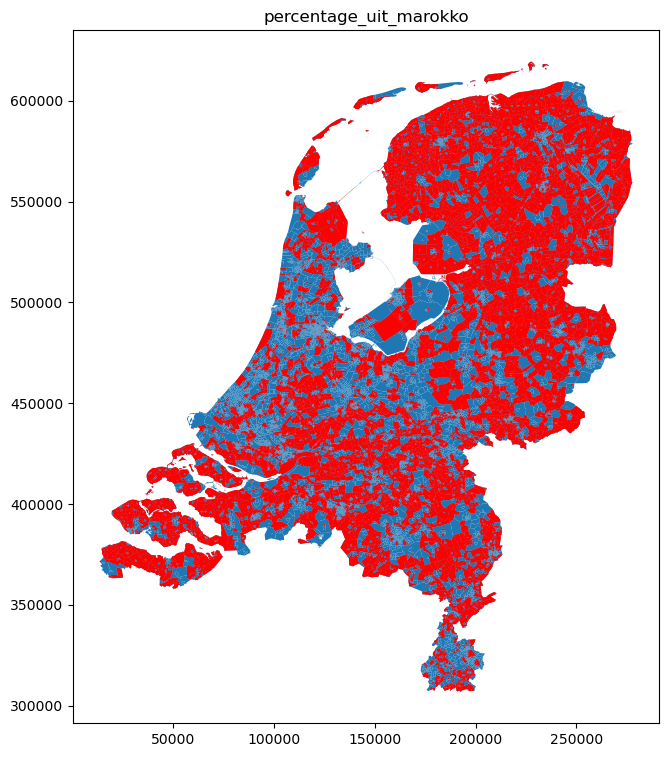

In [26]:
index = df_neighbourhood[df_neighbourhood["percentage_uit_marokko"]<0].index

# plot the missing districts on the map 
f, ax = plt.subplots(1, figsize=(9, 9))
df_neighbourhood.plot(ax=ax, linewidth=0.1, aspect="equal")
missing_district_location = df_neighbourhood.loc[index, ['geometry']]
# Plot focal polygon
missing_district_location.plot(ax=ax, linewidth=0.1, facecolor='red', alpha=1, aspect="equal")
_ = ax.set_title("percentage_uit_marokko")

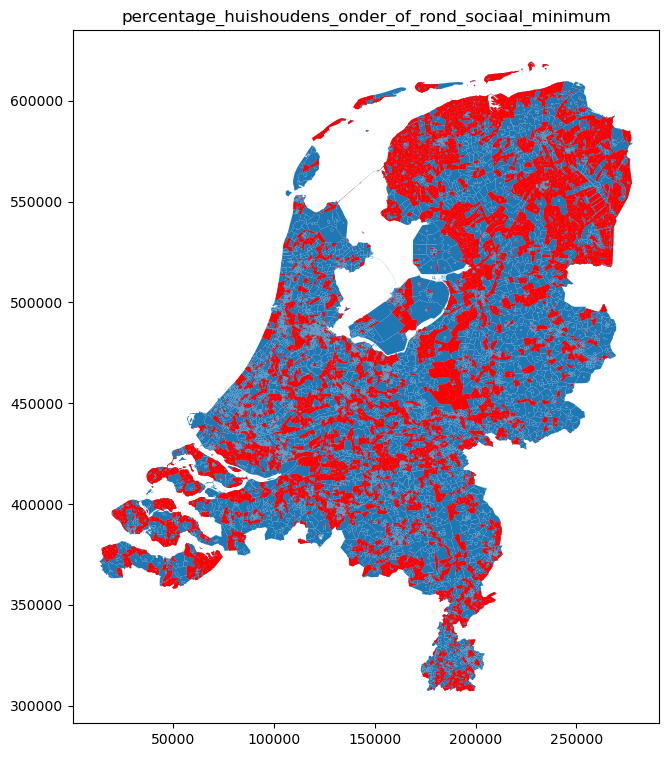

In [27]:
index = df_neighbourhood[df_neighbourhood["percentage_huishoudens_onder_of_rond_sociaal_minimum"]<0].index

# plot the missing districts on the map 
f, ax = plt.subplots(1, figsize=(9, 9))
df_neighbourhood.plot(ax=ax, linewidth=0.1, aspect="equal")
missing_district_location = df_neighbourhood.loc[index, ['geometry']]
# Plot focal polygon
missing_district_location.plot(ax=ax, linewidth=0.1, facecolor='red', alpha=1, aspect="equal")
_ = ax.set_title("percentage_huishoudens_onder_of_rond_sociaal_minimum")

There are 13208 entries. The variables **gemiddeld_inkomen_per_inkomensontvanger** (average income per recipient) and **gemiddeld_inkomen_per_inwoner** (average income per inhabitant) have about 11000 missing values each. There are other variables to represent the income. So, dropping these 2 variables from the analysis wouldn't impact the analysis approach.


For the variables with more than 4000 missing values, their spatial distribution prevent using the neighbours' mean to fill in the missing values. The plots showing the spatial distributions of "percentage_uit_marokko" with 4546 missing values, and that of "percentage_huishoudens_onder_of_rond_sociaal_minimum" with 3576 missing values are examples to substantiate this claim.

Therefore, only the variables with fewer than 4000 missing variables are retained.

Additionally, in the plot "percentage_huishoudens_onder_of_rond_sociaal_minimum", the missing values (in red) shows that the missing values of the neighborhood are clustered together. So, if using knn neighbours' minimum value to fill the missing values, the number of neighbors to be selected must be larger than 2. The number of neighbours is then selected to be 5

# Implications -> fill

In [105]:
missing_value_count = (df_neighbourhood[num_columns]<0).sum(axis=0)
drop_columns = missing_value_count[missing_value_count > 4000].index

df_neighbourhood = df_neighbourhood.drop(columns=drop_columns)
num_columns = df_neighbourhood.select_dtypes(include=["int64", "float64"]).columns

In [106]:
missing_value_count = (df_neighbourhood[num_columns]<0).sum(axis=0)
missing_value_count

omgevingsadressendichtheid                                 1
stedelijkheid_adressen_per_km2                             0
bevolkingsdichtheid_inwoners_per_km2                       0
aantal_inwoners                                            0
percentage_personen_0_tot_15_jaar                        777
percentage_personen_15_tot_25_jaar                       777
percentage_personen_25_tot_45_jaar                       777
percentage_personen_45_tot_65_jaar                       777
percentage_personen_65_jaar_en_ouder                     777
geboorte_totaal                                            0
geboortes_per_1000_inwoners                                0
sterfte_totaal                                             0
sterfte_relatief                                           0
aantal_huishoudens                                         0
percentage_huishoudens_zonder_kinderen                   303
percentage_huishoudens_met_kinderen                      303
percentage_westerse_migr

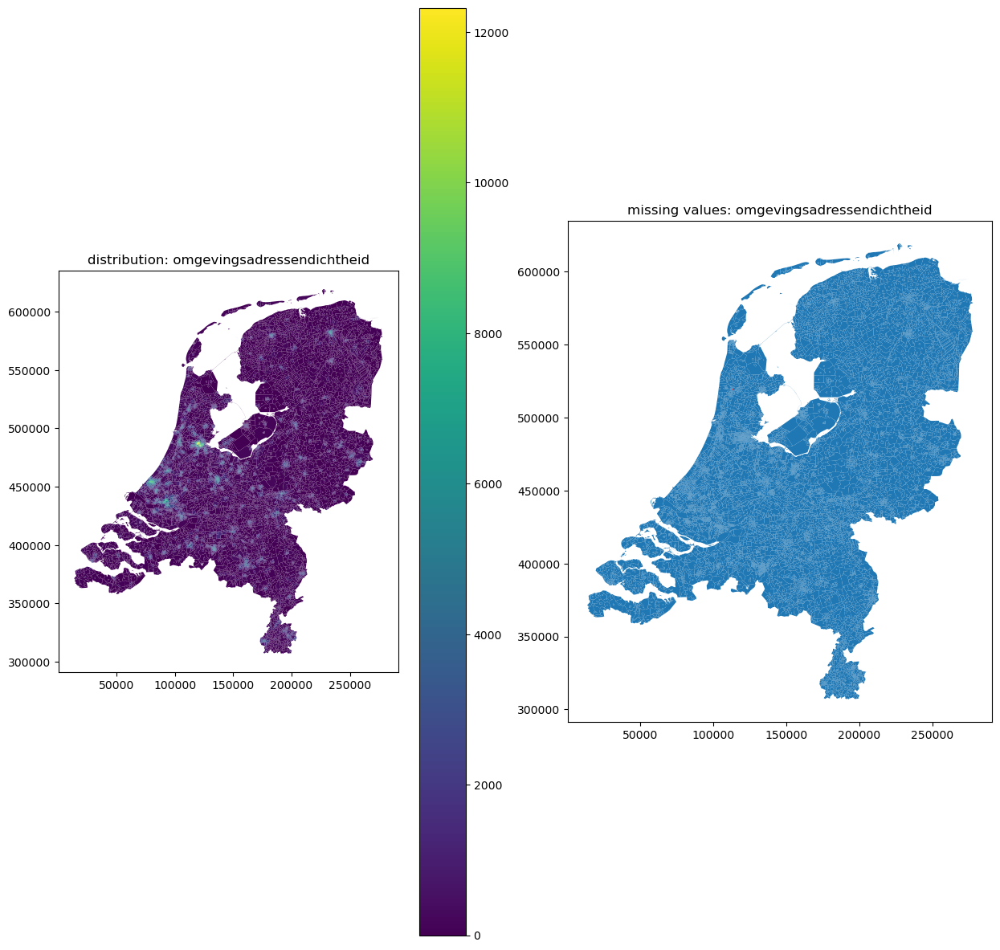

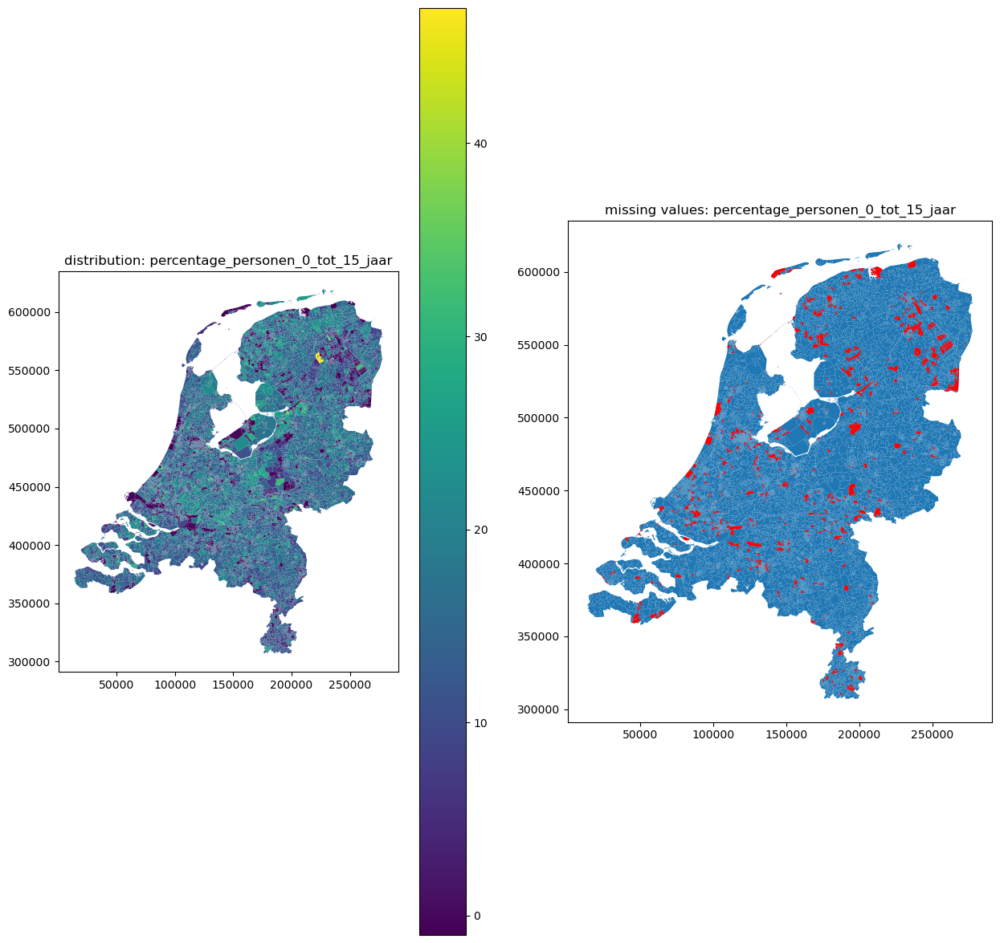

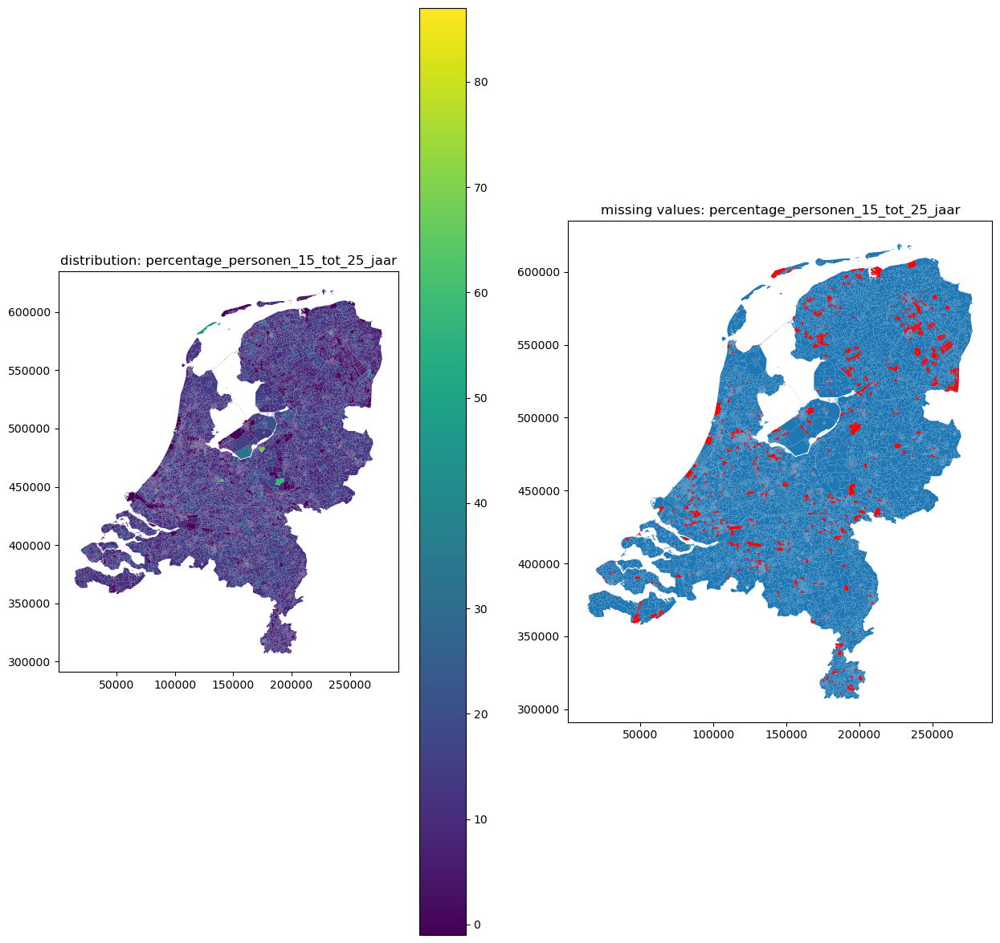

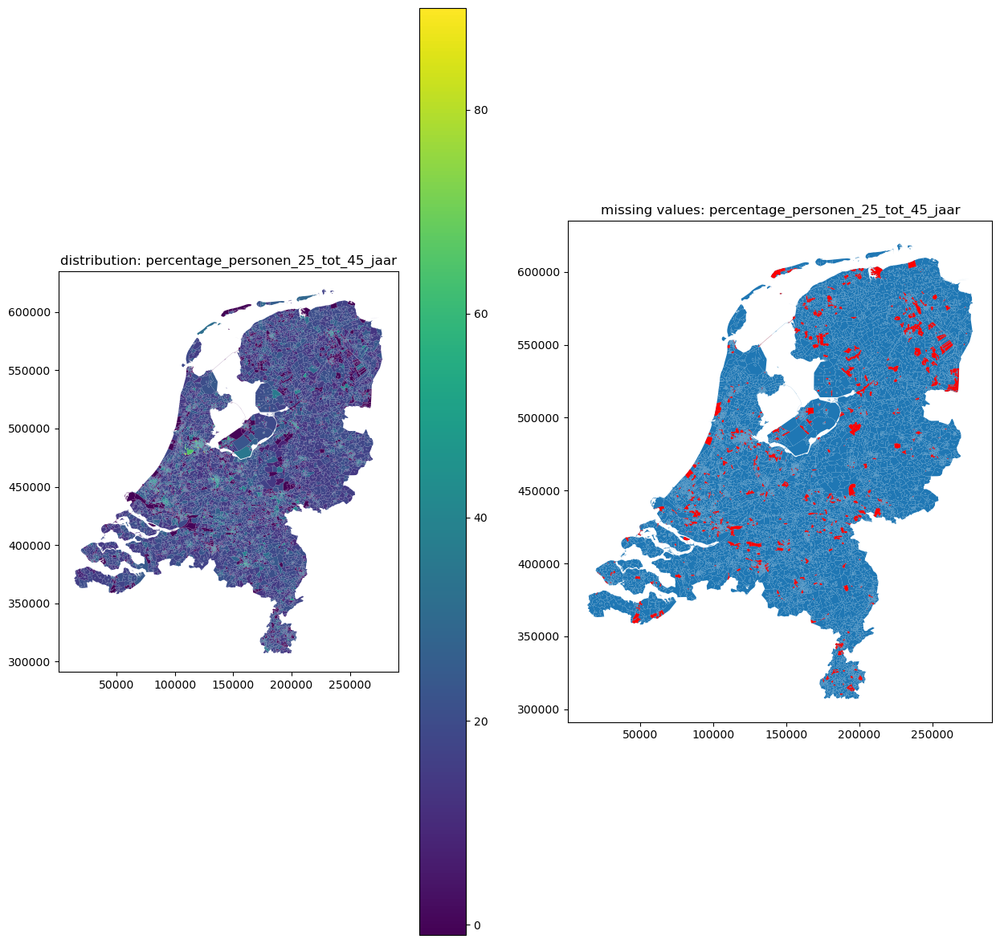

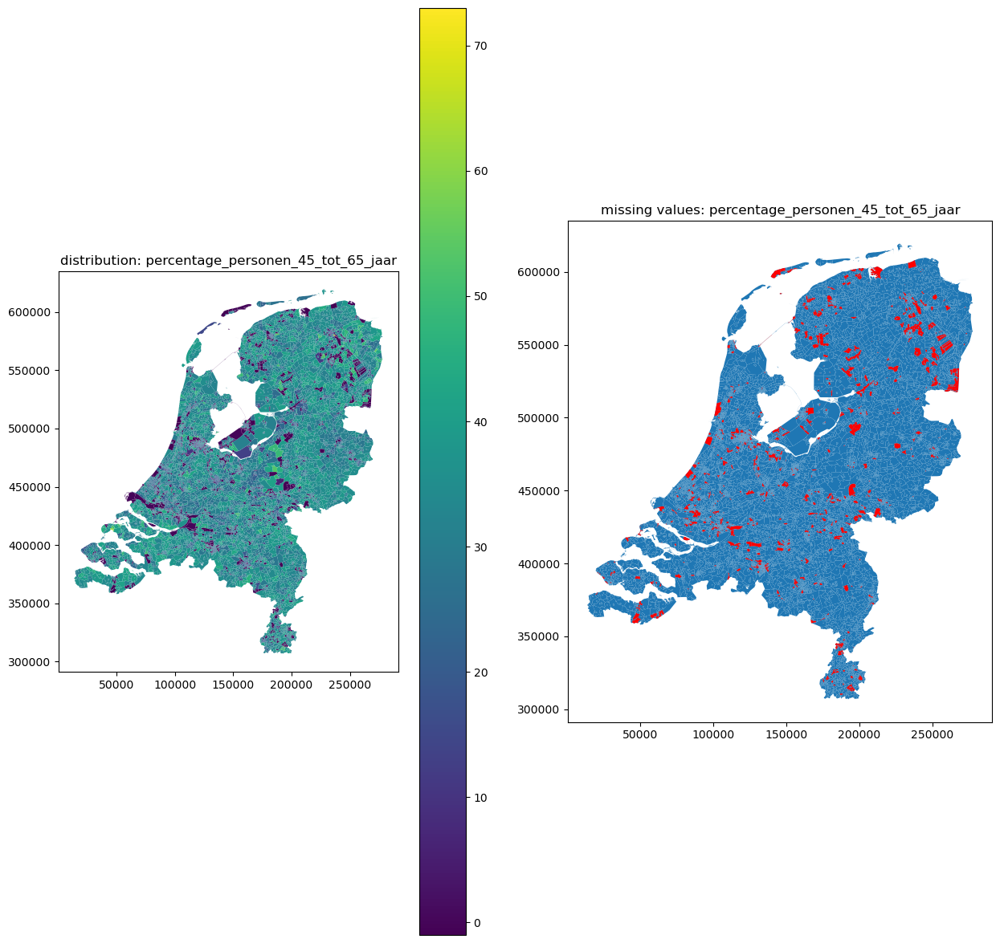

...

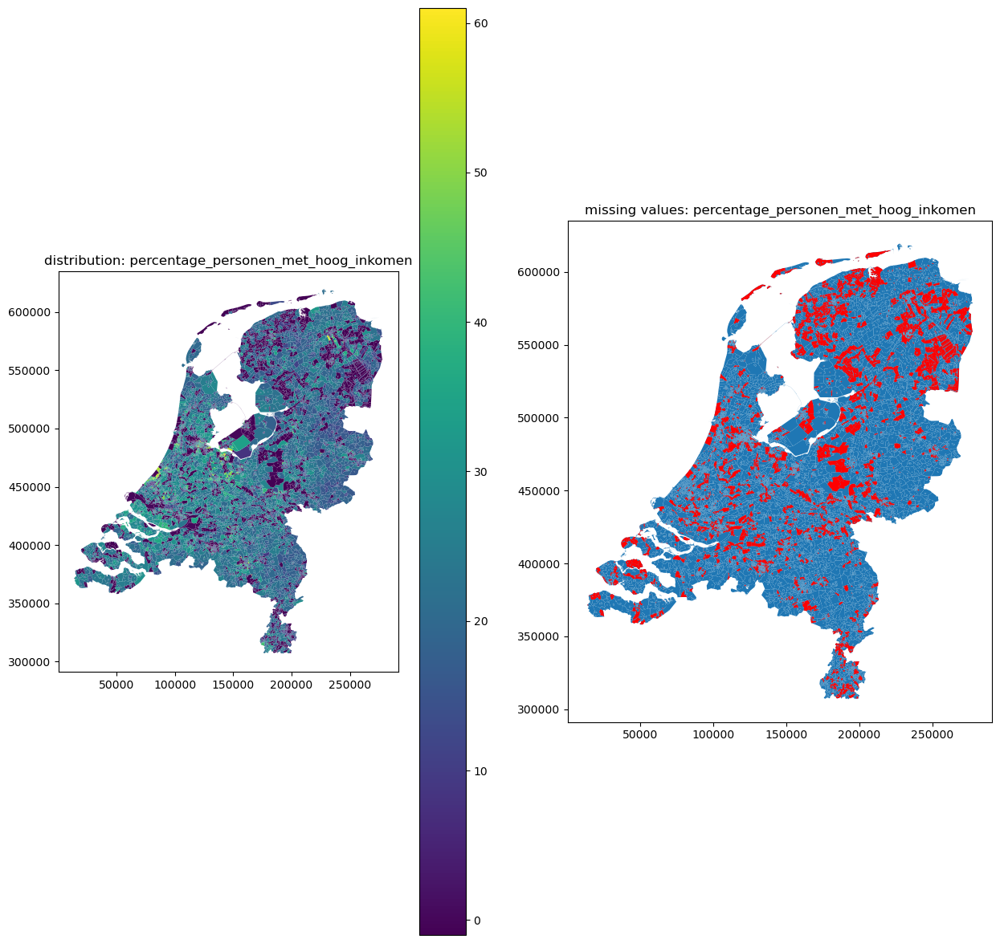

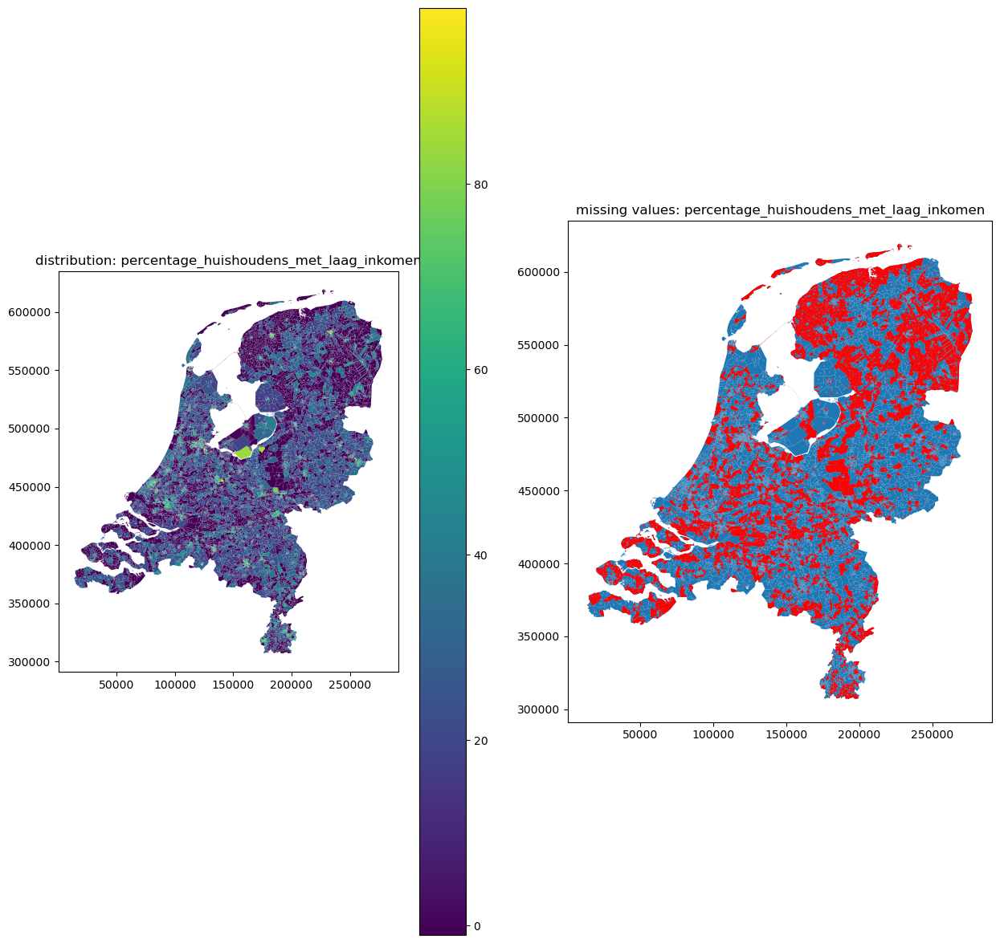

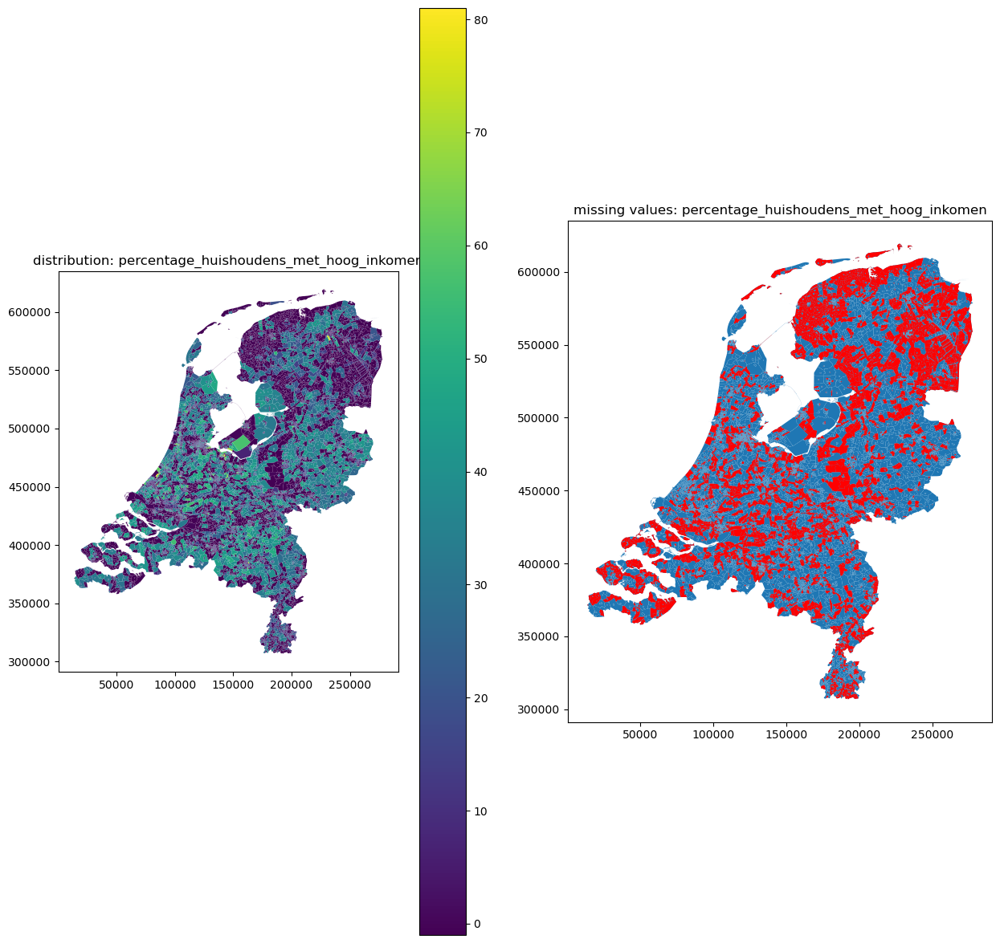

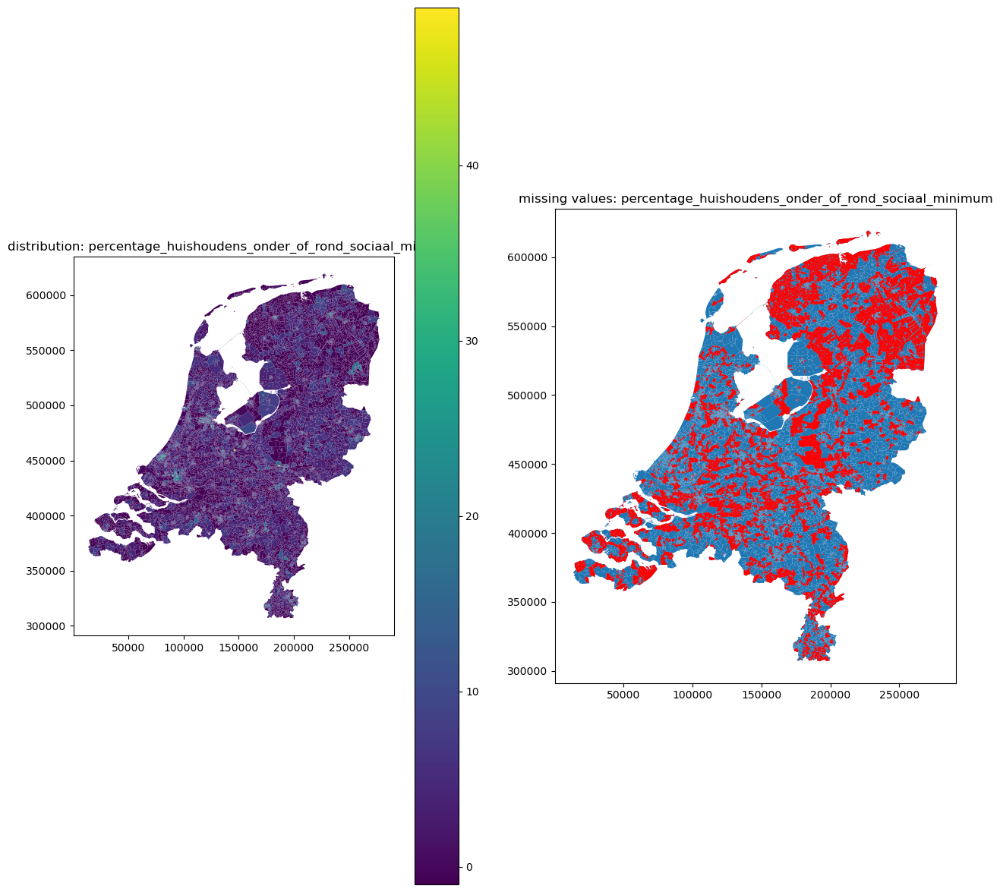

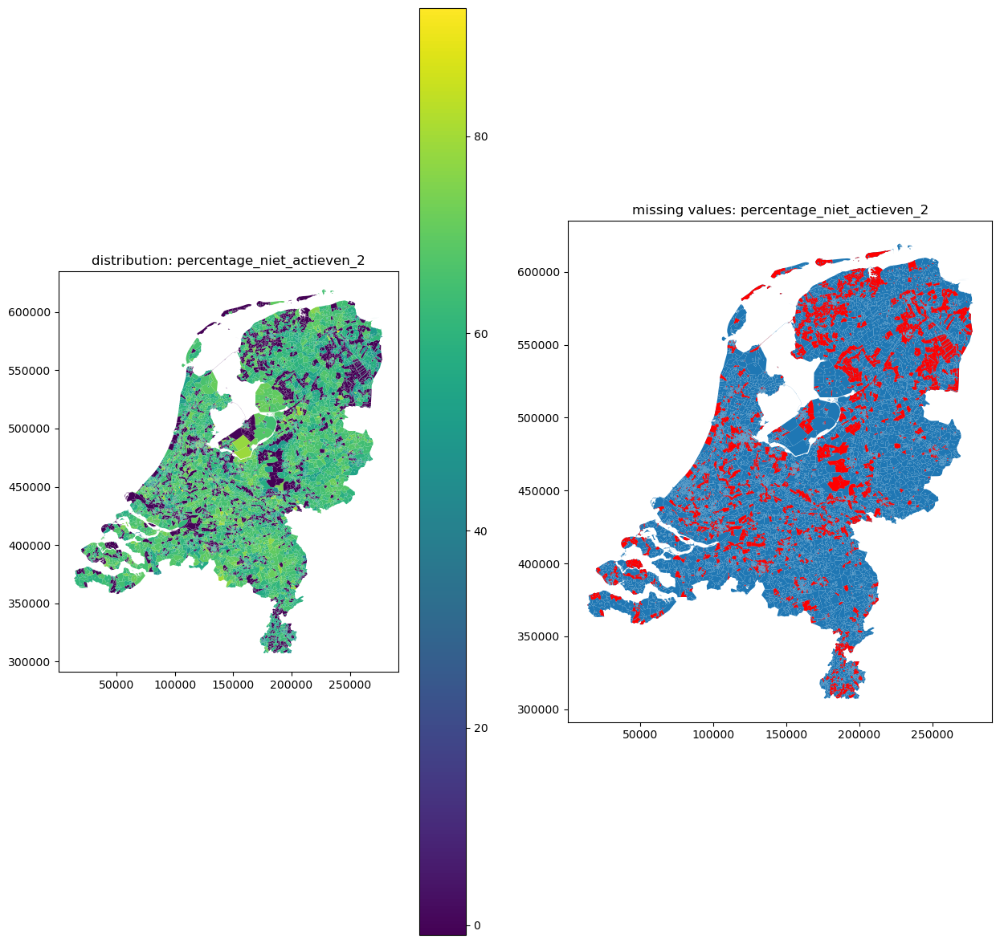

In [30]:
missing_columns = missing_value_count[missing_value_count > 0].index

for col in missing_columns:
    f, ax = plt.subplots(1, 2, figsize=(15, 15))
    #plot value distribution of columns with missing values
    df_neighbourhood.plot(ax=ax[0], column=col, linewidth=0.1, aspect="equal", legend=True)
    _ = ax[0].set_title("distribution: %s" % col)
    
    #plot missing value distribution
    index = df_neighbourhood[df_neighbourhood[col]<0].index
    df_neighbourhood.plot(ax=ax[1], linewidth=0.1, aspect="equal")
    missing_value_location = df_neighbourhood.loc[index, ['geometry']]
    missing_value_location.plot(ax=ax[1], linewidth=0.1, facecolor='red', alpha=1, aspect="equal")
    _ = ax[1].set_title("missing values: %s" % col)

    plt.show()

The plots of the columns with missing value distribution show that the value neighbourhood that are close-by have approximate equal values. Therefore, it is possible to use the mean values of a neighbour to fill in the missing values

# Spatial weights

In [107]:
# create spatial weight
w_queen = weights.Queen.from_dataframe(df_neighbourhood, ids='buurtcode')

/Users/nhitran/anaconda3/envs/gds/lib/python3.9/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
 There are 2 islands with ids: BU02431601, BU19420409.
  warnings.warn(message)


Because there are 6 disconnected components and 2 islands, the following steps are taken:
1. Find neighbourhood weight via knn method. From the figure of the missing data a
2. Unionise the 2 types of weights

In [108]:
w_knn = weights.KNN.from_dataframe(df_neighbourhood, k=5, ids='buurtcode')

/Users/nhitran/anaconda3/envs/gds/lib/python3.9/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
  warnings.warn(message)


In [109]:
# union queen and knn weights
w = weights.set_operations.w_union(w_queen, w_knn)

# row-standardize the weight matrix
w.transform = "R"

/Users/nhitran/anaconda3/envs/gds/lib/python3.9/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


In [110]:
df_neighbourhood.insert(len(df_neighbourhood.columns), "component_labels", w.component_labels)
df_neighbourhood.component_labels = df_neighbourhood.component_labels.astype("category")

<Axes: >

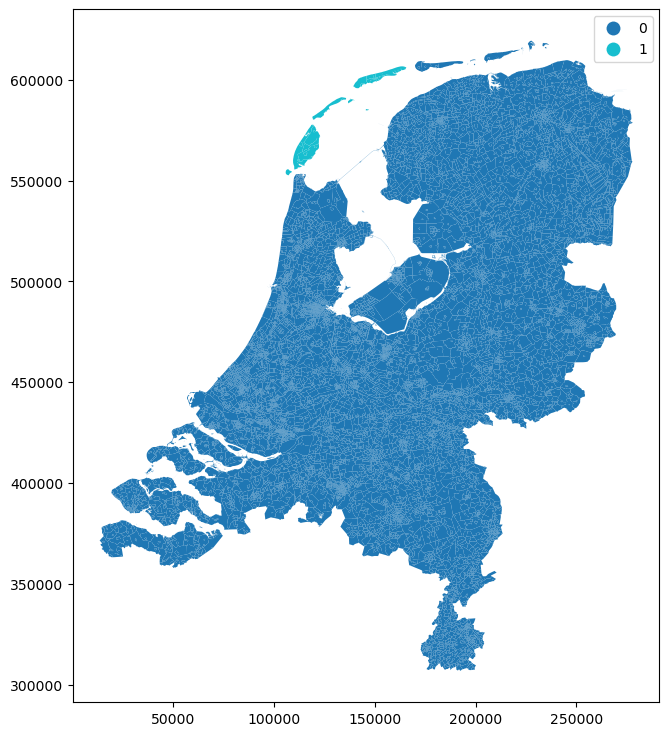

In [111]:
df_neighbourhood.plot(column="component_labels", legend=True, figsize=(9, 9), aspect="equal")

# EDA
Check Moran's I value for all the socio column to see if the distributions are random

In [112]:
df_MI = np.zeros((len(num_columns), 2))

for i, col in enumerate(num_columns):
    mi = esda.Moran(df_neighbourhood[col], w)
    df_MI[i] = np.array((mi.I, mi.p_sim))
df_MI = pd.DataFrame(df_MI, columns=["Moran_I", "p_sim"])
df_MI.insert(0, "variable", num_columns)
df_MI.insert(df_MI.shape[1], "Moran_I_positive", df_MI.Moran_I>0)
df_MI.insert(df_MI.shape[1], "p_sim_less_0.005", df_MI.p_sim<0.005)
df_MI

,variable,Moran_I,p_sim,Moran_I_positive,p_sim_less_0.005
0,omgevingsadressendichtheid,0.886950,0.001,True,True
1,stedelijkheid_adressen_per_km2,0.666462,0.001,True,True
2,bevolkingsdichtheid_inwoners_per_km2,0.617658,0.001,True,True
3,aantal_inwoners,0.270263,0.001,True,True
4,percentage_personen_0_tot_15_jaar,0.177264,0.001,True,True
5,percentage_personen_15_tot_25_jaar,0.190071,0.001,True,True
6,percentage_personen_25_tot_45_jaar,0.276774,0.001,True,True
7,percentage_personen_45_tot_65_jaar,0.175125,0.001,True,True
8,percentage_personen_65_jaar_en_ouder,0.200723,0.001,True,True
9,geboorte_totaal,0.306395,0.001,True,True


In [113]:
negative_MoranI_columns = df_MI.variable[df_MI.Moran_I_positive<1].values
for col in negative_MoranI_columns:
    df_neighbourhood.plot(column=col, figsize=(9, 9), aspect="equal", legend=True)
    plt.title(col)
    plt.show()

The Moran's I values and the p_sim values show that the selected variable distributions isn't random in space for all variables.

Therefore, we can use the first law of Geo-Spatial to fill in missing values using the mean values of the neighbours.

In [114]:
def find_neighbor_index(gdf, neigborhood_code):
    return gdf.sindex.nearest(gdf.geometry[gdf.buurtcode==neigborhood_code])[1]

def calculate_neighbor_mean(gdf, column, neighbor_index, round_value=True):
    if round_value:
        return round(gdf.loc[neighbor_index, column].mean())
    else:
        return gdf.loc[neighbor_index, column].mean()

def fill_missing_with_neighbor_mean(gdf, column, round_value=False):
    index = gdf[column][gdf[column]<0].index
    # loop through all missing values to fill it with neighbor's means
    for ind in index:
        neighbor_index = find_neighbor_index(gdf, gdf.buurtcode[ind])
        gdf.loc[ind, column] = calculate_neighbor_mean(gdf, column, neighbor_index, round_value)
    return gdf

missing_columns = missing_value_count[missing_value_count > 0].index
for col in missing_columns:
    df_neighbourhood[col] = df_neighbourhood[col].astype("float64")
    df_neighbourhood = fill_missing_with_neighbor_mean(df_neighbourhood, col)

In [79]:
missing_value_count = (df_neighbourhood[num_columns]<0).sum(axis=0)
missing_columns = missing_value_count[missing_value_count > 0].index
missing_value_count

omgevingsadressendichtheid                                0
stedelijkheid_adressen_per_km2                            0
bevolkingsdichtheid_inwoners_per_km2                      0
aantal_inwoners                                           0
percentage_personen_0_tot_15_jaar                         5
percentage_personen_15_tot_25_jaar                        5
percentage_personen_25_tot_45_jaar                        5
percentage_personen_45_tot_65_jaar                        5
percentage_personen_65_jaar_en_ouder                      6
geboorte_totaal                                           0
geboortes_per_1000_inwoners                               0
sterfte_totaal                                            0
sterfte_relatief                                          0
aantal_huishoudens                                        0
percentage_huishoudens_zonder_kinderen                    0
percentage_huishoudens_met_kinderen                       0
percentage_westerse_migratieachtergrond 

In [115]:
column_name_EN = {
    "buurtcode": "district_code",
    "buurtnaam": "district_name",
    "gemeentecode": "municipality_code",
    "gemeentenaam": "municipality_name",
    "meest_voorkomende_postcode": "district_postcode",
    "omgevingsadressendichtheid" : "environmental_address_density",
    "stedelijkheid_adressen_per_km2" : "urbanization_address_per_km2",
    "bevolkingsdichtheid_inwoners_per_km2" : "population_density_per_km2",
    "aantal_inwoners" : "total_inhabitants",
    "percentage_personen_0_tot_15_jaar" : "percentage_00_15",
    "percentage_personen_15_tot_25_jaar" : "percentage_15_25",
    "percentage_personen_25_tot_45_jaar" : "percentage_25_45",
    "percentage_personen_45_tot_65_jaar" : "percentage_45_65",
    "percentage_personen_65_jaar_en_ouder" : "percentage_65_oo",
    "geboorte_totaal" : "total_birth",
    "geboortes_per_1000_inwoners" : "total_birth_per_1000_inhabitant",
    "sterfte_totaal" : "total_death",
    "sterfte_relatief" : "death_rate",
    "aantal_huishoudens" : "total_households",
    "percentage_huishoudens_zonder_kinderen" : "percentage_households_no_children",
    "percentage_huishoudens_met_kinderen" : "percentage_households_with_children",
    "percentage_westerse_migratieachtergrond" : "percentage_western_immigrant",
    "percentage_niet_westerse_migratieachtergrond" : "percentage_non_western_immigrant",
    "woningvoorraad" : "total_houses",
    "gemiddelde_woningwaarde" : "average_house_value",
    "percentage_eengezinswoning" : "percentage_single_family_household",
    "percentage_meergezinswoning" : "percentage_multiple_family_household",
    "aantal_inkomensontvangers" : "total_income_recipients",
    "percentage_personen_met_laag_inkomen" : "percentage_person_low_income",
    "percentage_personen_met_hoog_inkomen" : "percentage_person_high_income",
    "percentage_huishoudens_met_laag_inkomen" : "percentage_household_low_income",
    "percentage_huishoudens_met_hoog_inkomen" : "percentage_household_high_income",
    "percentage_huishoudens_onder_of_rond_sociaal_minimum" : "percentage_household_below_social_minimum",
    "percentage_niet_actieven_2" : "percentage_non_active",
    "personenautos_totaal" : "total_personal_auto",
    "personenautos_per_huishouden" : "personal_auto_per_household",
    "personenautos_per_km2" : "personal_auto_per_km2",
    "motortweewielers_totaal" : "total_2_wheel_motocycle",
    "oppervlakte_land_in_ha" : "total_land_area_ha"
}

df_neighbourhood = df_neighbourhood.rename(columns=column_name_EN)

In [116]:
df_neighbourhood.drop(columns="component_labels").to_file(os.path.join("data", "socio_factor.gpkg"), driver='GPKG', crs="EPSG:4326")
df_neighbourhood.head()

,district_code,district_name,municipality_code,municipality_name,district_postcode,geometry,environmental_address_density,urbanization_address_per_km2,population_density_per_km2,total_inhabitants,...,percentage_household_low_income,percentage_household_high_income,percentage_household_below_social_minimum,percentage_non_active,total_personal_auto,personal_auto_per_household,personal_auto_per_km2,total_2_wheel_motocycle,total_land_area_ha,component_labels
0,BU00030000,Appingedam-Centrum,GM0003,Appingedam,9901,"MULTIPOLYGON (((253641.500 594417.813, 253607....",1190.0,3,2774,2335,...,59.000000,10.000000,11.000000,53.000000,1055,0.8,1249,80,84,0
1,BU00030001,Appingedam-West,GM0003,Appingedam,9903,"MULTIPOLYGON (((251260.528 594393.827, 251260....",894.0,4,1950,3080,...,32.000000,19.000000,6.000000,57.000000,1515,1.1,959,160,158,0
2,BU00030002,Appingedam-Oost,GM0003,Appingedam,9902,"MULTIPOLYGON (((254580.674 594573.506, 254580....",1112.0,3,2094,5955,...,54.000000,7.000000,10.000000,49.000000,2520,0.9,886,255,284,0
3,BU00030007,Verspreide huizen Damsterdiep en Eemskanaal,GM0003,Appingedam,9903,"MULTIPOLYGON (((251377.797 593488.313, 251331....",351.0,5,59,320,...,12.000000,35.000000,3.000000,66.000000,190,1.6,35,35,540,0
4,BU00030008,Verspreide huizen ten zuiden van Eemskanaal,GM0003,Appingedam,9902,"MULTIPOLYGON (((254983.248 592485.983, 254956....",74.0,5,18,100,...,22.857143,16.285714,5.571429,50.142857,65,2.0,0,15,554,0


In [129]:
# gpd.read_file(os.path.join("data", "socio_factor.gpkg"))

# Call dataset

In [118]:
selected_columns_call =["pmeTimeStamp", "pmeDienst", "pmeLatitude", "pmeLongitude", "pme_wplId", "wplNam", "pme_gemId", "gemName"]
location_columns_call = ["pme_wplId", "wplNam", "pme_gemId", "gemName"]
df_call_raw[selected_columns_call].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4775504 entries, 0 to 4775503
Data columns (total 8 columns):
 #   Column        Dtype 
---  ------        ----- 
 0   pmeTimeStamp  object
 1   pmeDienst     object
 2   pmeLatitude   object
 3   pmeLongitude  object
 4   pme_wplId     object
 5   wplNam        object
 6   pme_gemId     object
 7   gemName       object
dtypes: object(8)
memory usage: 291.5+ MB


1. convert pmeTimeStamp to timeStamp
1. index = calls in 2017
2. create: month, day, weekday, hour column
1. create dummies for pmeDienst
1. aggregate dummies for pmeDienst by pme_wplId and by month
    2. add to df_call

In [119]:
df_call_raw.pmeTimeStamp = df_call_raw.pmeTimeStamp.astype("datetime64[ns]")
df_call_raw.pmeTimeStamp

0         2017-01-01 00:00:13
1         2017-01-01 00:00:14
2         2017-01-01 00:00:23
3         2017-01-01 00:00:37
4         2017-01-01 00:00:39
                  ...        
4775499   2020-08-30 19:29:35
4775500   2020-08-30 19:29:35
4775501   2020-08-30 19:29:38
4775502   2020-08-30 19:29:40
4775503   2020-08-30 19:31:03
Name: pmeTimeStamp, Length: 4775504, dtype: datetime64[ns]

In [120]:
index_2017 = df_call_raw[(df_call_raw.pmeTimeStamp >= "2017-01-01 00:00:00") &(df_call_raw.pmeTimeStamp < "2018-01-01 00:00:00")].index
index_2017

Index([      0,       1,       2,       3,       4,       5,       6,       7,
             8,       9,
       ...
       1273788, 1273789, 1273790, 1273791, 1273792, 1273793, 1273794, 1273795,
       1273796, 1273797],
      dtype='int64', length=1273798)

In [121]:
df_call_raw_2017 = df_call_raw.loc[index_2017, selected_columns_call].copy()
df_call_raw_2017

,pmeTimeStamp,pmeDienst,pmeLatitude,pmeLongitude,pme_wplId,wplNam,pme_gemId,gemName
0,2017-01-01 00:00:13,B,52.0787776,5.0911088,4628,Utrecht,357,Utrecht
1,2017-01-01 00:00:14,B,52.0623452,5.1199864,4628,Utrecht,357,Utrecht
2,2017-01-01 00:00:23,A,\N,\N,\N,\N,\N,\N
3,2017-01-01 00:00:37,A,52.0768602,4.2607498,4896,Den Haag,391,Den Haag
4,2017-01-01 00:00:39,P,52.0169832,4.6643519,4995,Moordrecht,5187,Zuidplas
...,...,...,...,...,...,...,...,...
1273793,2017-12-31 23:59:48,A,\N,\N,\N,\N,\N,\N
1273794,2017-12-31 23:59:54,B,\N,\N,\N,\N,\N,\N
1273795,2017-12-31 23:59:56,B,52.0258612,5.5712562,4639,Veenendaal,359,Veenendaal
1273796,2017-12-31 23:59:56,A,52.1148866,5.1258883,4628,Utrecht,357,Utrecht


remove observations where none of the information on "pme_wplId", "wplNam", "pme_gemId", "gemName", "pmeLatitude", pmeLongitude is available

this is because for these calls, it is not possible to locate them.

In [122]:
index_location = df_call_raw_2017[(df_call_raw_2017.pme_wplId != "\\N") \
                                    &(df_call_raw_2017.wplNam != "\\N") \
                                    &(df_call_raw_2017.pme_gemId != "\\N")\
                                    &(df_call_raw_2017.gemName != "\\N") \
                                    &(df_call_raw_2017.pmeLatitude != "\\N") \
                                    &(df_call_raw_2017.pmeLongitude != "\\N")].index

df_call_raw_2017 = df_call_raw_2017.loc[index_location, selected_columns_call].copy()
df_call_raw_2017

,pmeTimeStamp,pmeDienst,pmeLatitude,pmeLongitude,pme_wplId,wplNam,pme_gemId,gemName
0,2017-01-01 00:00:13,B,52.0787776,5.0911088,4628,Utrecht,357,Utrecht
1,2017-01-01 00:00:14,B,52.0623452,5.1199864,4628,Utrecht,357,Utrecht
3,2017-01-01 00:00:37,A,52.0768602,4.2607498,4896,Den Haag,391,Den Haag
4,2017-01-01 00:00:39,P,52.0169832,4.6643519,4995,Moordrecht,5187,Zuidplas
5,2017-01-01 00:00:50,B,52.0767439,4.3883835,4975,Leidschendam,411,Leidschendam-Voorburg
...,...,...,...,...,...,...,...,...
1273791,2017-12-31 23:59:28,B,51.5115434,3.8769227,4679,Goes,366,Goes
1273792,2017-12-31 23:59:35,A,52.0415669,5.6539204,1665,Ede,76,Ede
1273795,2017-12-31 23:59:56,B,52.0258612,5.5712562,4639,Veenendaal,359,Veenendaal
1273796,2017-12-31 23:59:56,A,52.1148866,5.1258883,4628,Utrecht,357,Utrecht


In [124]:
df_call_raw_2017.insert(1, "month", df_call_raw_2017.pmeTimeStamp.dt.month)
df_call_raw_2017.insert(2, "day", df_call_raw_2017.pmeTimeStamp.dt.day)
df_call_raw_2017.insert(3, "weekday", df_call_raw_2017.pmeTimeStamp.dt.weekday)
df_call_raw_2017.insert(4, "hour", df_call_raw_2017.pmeTimeStamp.dt.hour)

In [125]:
df_call_raw_2017

,pmeTimeStamp,month,day,weekday,hour,pmeDienst,pmeLatitude,pmeLongitude,pme_wplId,wplNam,pme_gemId,gemName
0,2017-01-01 00:00:13,1,1,6,0,B,52.0787776,5.0911088,4628,Utrecht,357,Utrecht
1,2017-01-01 00:00:14,1,1,6,0,B,52.0623452,5.1199864,4628,Utrecht,357,Utrecht
3,2017-01-01 00:00:37,1,1,6,0,A,52.0768602,4.2607498,4896,Den Haag,391,Den Haag
4,2017-01-01 00:00:39,1,1,6,0,P,52.0169832,4.6643519,4995,Moordrecht,5187,Zuidplas
5,2017-01-01 00:00:50,1,1,6,0,B,52.0767439,4.3883835,4975,Leidschendam,411,Leidschendam-Voorburg
...,...,...,...,...,...,...,...,...,...,...,...,...
1273791,2017-12-31 23:59:28,12,31,6,23,B,51.5115434,3.8769227,4679,Goes,366,Goes
1273792,2017-12-31 23:59:35,12,31,6,23,A,52.0415669,5.6539204,1665,Ede,76,Ede
1273795,2017-12-31 23:59:56,12,31,6,23,B,52.0258612,5.5712562,4639,Veenendaal,359,Veenendaal
1273796,2017-12-31 23:59:56,12,31,6,23,A,52.1148866,5.1258883,4628,Utrecht,357,Utrecht


In [126]:
df_call_raw_2017 = pd.get_dummies(df_call_raw_2017, columns=["pmeDienst"])
df_call_raw_2017

,pmeTimeStamp,month,day,weekday,hour,pmeLatitude,pmeLongitude,pme_wplId,wplNam,pme_gemId,gemName,pmeDienst_A,pmeDienst_B,pmeDienst_K,pmeDienst_P,pmeDienst_\N
0,2017-01-01 00:00:13,1,1,6,0,52.0787776,5.0911088,4628,Utrecht,357,Utrecht,False,True,False,False,False
1,2017-01-01 00:00:14,1,1,6,0,52.0623452,5.1199864,4628,Utrecht,357,Utrecht,False,True,False,False,False
3,2017-01-01 00:00:37,1,1,6,0,52.0768602,4.2607498,4896,Den Haag,391,Den Haag,True,False,False,False,False
4,2017-01-01 00:00:39,1,1,6,0,52.0169832,4.6643519,4995,Moordrecht,5187,Zuidplas,False,False,False,True,False
5,2017-01-01 00:00:50,1,1,6,0,52.0767439,4.3883835,4975,Leidschendam,411,Leidschendam-Voorburg,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273791,2017-12-31 23:59:28,12,31,6,23,51.5115434,3.8769227,4679,Goes,366,Goes,False,True,False,False,False
1273792,2017-12-31 23:59:35,12,31,6,23,52.0415669,5.6539204,1665,Ede,76,Ede,True,False,False,False,False
1273795,2017-12-31 23:59:56,12,31,6,23,52.0258612,5.5712562,4639,Veenendaal,359,Veenendaal,False,True,False,False,False
1273796,2017-12-31 23:59:56,12,31,6,23,52.1148866,5.1258883,4628,Utrecht,357,Utrecht,True,False,False,False,False


In [127]:
column_name_EN = {
    "pmeTimeStamp": "timeStamp",
    "pmeLongitude" : "longitude",
    "pmeLatitude" : "latitude",
    "pme_wplId" : "district_postcode",
    "wplNam" : "district_name",
    "pme_gemId" : "municipality_postcode",
    "gemName" : "municipality_name",
    "pmeDienst_A" : "ambulance",
    "pmeDienst_B" : "fire_brigade",
    "pmeDienst_P" : "police",
    "pmeDienst_K" : "sea_rescue",
    "pmeDienst_\\N" : "serviceNA"
}
df_call_raw_2017 = df_call_raw_2017.rename(columns=column_name_EN)
df_call_raw_2017

,timeStamp,month,day,weekday,hour,latitude,longitude,district_postcode,district_name,municipality_postcode,municipality_name,ambulance,fire_brigade,sea_rescue,police,serviceNA
0,2017-01-01 00:00:13,1,1,6,0,52.0787776,5.0911088,4628,Utrecht,357,Utrecht,False,True,False,False,False
1,2017-01-01 00:00:14,1,1,6,0,52.0623452,5.1199864,4628,Utrecht,357,Utrecht,False,True,False,False,False
3,2017-01-01 00:00:37,1,1,6,0,52.0768602,4.2607498,4896,Den Haag,391,Den Haag,True,False,False,False,False
4,2017-01-01 00:00:39,1,1,6,0,52.0169832,4.6643519,4995,Moordrecht,5187,Zuidplas,False,False,False,True,False
5,2017-01-01 00:00:50,1,1,6,0,52.0767439,4.3883835,4975,Leidschendam,411,Leidschendam-Voorburg,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273791,2017-12-31 23:59:28,12,31,6,23,51.5115434,3.8769227,4679,Goes,366,Goes,False,True,False,False,False
1273792,2017-12-31 23:59:35,12,31,6,23,52.0415669,5.6539204,1665,Ede,76,Ede,True,False,False,False,False
1273795,2017-12-31 23:59:56,12,31,6,23,52.0258612,5.5712562,4639,Veenendaal,359,Veenendaal,False,True,False,False,False
1273796,2017-12-31 23:59:56,12,31,6,23,52.1148866,5.1258883,4628,Utrecht,357,Utrecht,True,False,False,False,False


In [128]:
df_call_raw_2017.insert(len(df_call_raw_2017.columns), 
                        "geometry", 
                        gpd.points_from_xy(x=df_call_raw_2017.longitude, 
                                           y=df_call_raw_2017.latitude,
                                          crs="EPSG:4326"))
gdf_call_raw_2017 = gpd.GeoDataFrame(df_call_raw_2017, geometry="geometry", crs="EPSG:4326")
gdf_call_raw_2017.to_file(os.path.join("data", "call_2017.gpkg"), driver='GPKG', crs="EPSG:4326")

In [130]:
gpd.read_file(os.path.join("data", "call_2017.gpkg"))

,timeStamp,month,day,weekday,hour,latitude,longitude,district_postcode,district_name,municipality_postcode,municipality_name,ambulance,fire_brigade,sea_rescue,police,serviceNA,geometry
0,2017-01-01 00:00:13,1,1,6,0,52.0787776,5.0911088,4628,Utrecht,357,Utrecht,False,True,False,False,False,POINT (5.09111 52.07878)
1,2017-01-01 00:00:14,1,1,6,0,52.0623452,5.1199864,4628,Utrecht,357,Utrecht,False,True,False,False,False,POINT (5.11999 52.06235)
2,2017-01-01 00:00:37,1,1,6,0,52.0768602,4.2607498,4896,Den Haag,391,Den Haag,True,False,False,False,False,POINT (4.26075 52.07686)
3,2017-01-01 00:00:39,1,1,6,0,52.0169832,4.6643519,4995,Moordrecht,5187,Zuidplas,False,False,False,True,False,POINT (4.66435 52.01698)
4,2017-01-01 00:00:50,1,1,6,0,52.0767439,4.3883835,4975,Leidschendam,411,Leidschendam-Voorburg,False,True,False,False,False,POINT (4.38838 52.07674)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1203556,2017-12-31 23:59:28,12,31,6,23,51.5115434,3.8769227,4679,Goes,366,Goes,False,True,False,False,False,POINT (3.87692 51.51154)
1203557,2017-12-31 23:59:35,12,31,6,23,52.0415669,5.6539204,1665,Ede,76,Ede,True,False,False,False,False,POINT (5.65392 52.04157)
1203558,2017-12-31 23:59:56,12,31,6,23,52.0258612,5.5712562,4639,Veenendaal,359,Veenendaal,False,True,False,False,False,POINT (5.57126 52.02586)
1203559,2017-12-31 23:59:56,12,31,6,23,52.1148866,5.1258883,4628,Utrecht,357,Utrecht,True,False,False,False,False,POINT (5.12589 52.11489)


# use pivot table to aggregate values & merge to socio dataframe

In [132]:
table_month_pmeDienst_A = pd.pivot_table(df_call_raw_2017, fill_value=0,
                             values="ambulance", 
                             index=["district_postcode", "district_name", "municipality_postcode", "municipality_name"],
                             columns="month", 
                             aggfunc='sum')
column_name = {
    1 : "ambulance_month_1",
    2 : "ambulance_month_2",
    3 : "ambulance_month_3",
    4 : "ambulance_month_4",
    5 : "ambulance_month_5",
    6 : "ambulance_month_6",
    7 : "ambulance_month_7",
    8 : "ambulance_month_8",
    9 : "ambulance_month_9",
    10 : "ambulance_month_10",
    11 : "ambulance_month_11",
    12 : "ambulance_month_12"
}
table_month_pmeDienst_A = table_month_pmeDienst_A.reset_index().rename(columns=column_name)


table_month_pmeDienst_B = pd.pivot_table(df_call_raw_2017, fill_value=0,
                             values="fire_brigade", 
                             index=["district_postcode", "district_name", "municipality_postcode", "municipality_name"],
                             columns="month", 
                             aggfunc='sum')
column_name = {
    1 : "fire_brigade_month_1",
    2 : "fire_brigade_month_2",
    3 : "fire_brigade_month_3",
    4 : "fire_brigade_month_4",
    5 : "fire_brigade_month_5",
    6 : "fire_brigade_month_6",
    7 : "fire_brigade_month_7",
    8 : "fire_brigade_month_8",
    9 : "fire_brigade_month_9",
    10 : "fire_brigade_month_10",
    11 : "fire_brigade_month_11",
    12 : "fire_brigade_month_12"
}
table_month_pmeDienst_B = table_month_pmeDienst_B.reset_index().rename(columns=column_name)
# table_month_pmeDienst_B
table = table_month_pmeDienst_A.merge(table_month_pmeDienst_B, on=["district_postcode", "district_name", "municipality_postcode", "municipality_name"])
table

month,district_postcode,district_name,municipality_postcode,municipality_name,ambulance_month_1,ambulance_month_2,ambulance_month_3,ambulance_month_4,ambulance_month_5,ambulance_month_6,...,fire_brigade_month_3,fire_brigade_month_4,fire_brigade_month_5,fire_brigade_month_6,fire_brigade_month_7,fire_brigade_month_8,fire_brigade_month_9,fire_brigade_month_10,fire_brigade_month_11,fire_brigade_month_12
0,1002,Blija,37,Ferwerderadiel,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,1003,Ferwerd,124,Groningen,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1003,Ferwerd,37,Ferwerderadiel,0,0,0,0,0,0,...,5,1,0,2,0,2,1,0,2,0
3,1005,Hallum,37,Ferwerderadiel,0,0,0,0,0,0,...,2,0,0,4,3,4,2,3,1,1
4,1010,Marrum,37,Ferwerderadiel,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5100,990,Oostmahorn,36,Dongeradeel,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5101,991,Oostrum,36,Dongeradeel,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5102,993,Raard,36,Dongeradeel,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,2,0
5103,994,Ternaard,36,Dongeradeel,0,0,0,0,0,0,...,0,0,2,1,1,0,3,0,0,0


In [135]:
table.merge(df_neighbourhood, on=["district_name", "municipality_name"])

,district_postcode_x,district_name,municipality_postcode,municipality_name,ambulance_month_1,ambulance_month_2,ambulance_month_3,ambulance_month_4,ambulance_month_5,ambulance_month_6,...,percentage_household_low_income,percentage_household_high_income,percentage_household_below_social_minimum,percentage_non_active,total_personal_auto,personal_auto_per_household,personal_auto_per_km2,total_2_wheel_motocycle,total_land_area_ha,component_labels
0,1002,Blija,37,Ferwerderadiel,0,0,0,0,0,0,...,51.000000,9.000000,7.000000,58.0,335,1.2,525,35,64,0
1,1003,Ferwerd,37,Ferwerderadiel,0,0,0,0,0,0,...,45.000000,10.000000,9.000000,56.0,750,1.1,881,75,85,0
2,1005,Hallum,37,Ferwerderadiel,0,0,0,0,0,0,...,38.000000,16.000000,7.000000,59.0,1110,1.1,1213,105,91,0
3,1010,Marrum,37,Ferwerderadiel,0,0,0,0,0,0,...,41.000000,10.000000,6.000000,56.0,585,1.1,918,65,64,0
4,1012,Reitsum,37,Ferwerderadiel,0,0,0,0,0,0,...,1.484414,-0.435356,-0.519192,64.0,75,1.5,26,10,281,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1487,989,Oosternijkerk,36,Dongeradeel,0,0,0,0,0,0,...,34.000000,18.000000,7.000000,68.0,425,1.3,752,65,57,0
1488,990,Oostmahorn,36,Dongeradeel,0,0,0,0,0,0,...,-1.000000,-1.000000,-1.000000,34.5,50,1.0,0,5,69,0
1489,991,Oostrum,36,Dongeradeel,0,0,0,0,0,0,...,-1.000000,-1.000000,-1.000000,21.0,70,2.0,0,5,22,0
1490,993,Raard,36,Dongeradeel,0,0,0,0,0,0,...,-0.405248,-0.739942,-0.902915,65.0,120,1.4,38,10,322,0


# use groupby to aggregate values

In [ ]:
pmeDienst_by_month = df_call_raw_2017[["pme_wplId", "month", *bol_columns]].groupby(["pme_wplId", "month"]).sum().reset_index()
pmeDienst_by_month

In [ ]:
# # Plot photographs with smaller, more translucent dots
# ax = gdf_call_raw_2017.plot.scatter("pmeLongitude", 
#                         "pmeLatitude",
#                         s=0.25,
#                         c="xkcd:bright yellow",
#                         alpha=0.5,
#                         figsize=(9, 9)
#                        )
# # remove axis
# ax.set_axis_off()
# # Add dark basemap
# cx.add_basemap(ax, 
#                crs="EPSG:4326",
#                source=cx.providers.CartoDB.DarkMatter
#               )

# Ignore

In [ ]:
geodata_url = "https://service.pdok.nl/cbs/gebiedsindelingen/atom/v1_0/downloads/cbsgebiedsindelingen2017.gpkg"
municipal_boundaries = gpd.read_file(geodata_url)

In [ ]:
df_raw.gm_naam[df_raw.gm_naam.isin(municipal_boundaries.statnaam)].value_counts()

In [ ]:
geodata_url_1 = "https://service.pdok.nl/cbs/wijkenbuurten/2017/atom/downloads/WijkBuurtkaart_2017_v3.gpkg"
municipal_boundaries_1 = gpd.read_file(geodata_url_1)

In [ ]:
municipal_boundaries_1.columns
for col in municipal_boundaries_1.columns:
    print(col)